<h1>Checking data augmentation implentation</h2>

- This notebook is created to explore and check the correctness of tensors augmentation, the augmentations are implemented for an arbitrary number of channels but we will test them on an image with three channels so we can visualize the results.

### Necessary Packages

In [1]:
import os
import torch
import sys
sys.path.append('../..')
import dotenv
import matplotlib.pyplot as plt
from typing import Callable
from PIL import Image
from torchvision.transforms import ToTensor
from src.transforms import Flip,Transpose,LeftShift,RightShift,DownShift,UpShift,Pipeline


### Loading envirement variables

In [2]:
env = dotenv.find_dotenv()
DATA_DIR = dotenv.get_key(env, key_to_get="DATA_DIR")
print(DATA_DIR)

/home/abdelnour/Documents/4eme_anne/S2/projet/data/roi-dataset/BRACS_RoI/latest_version


In [3]:
wsi_path = os.path.join(DATA_DIR, "test", "0_N", "BRACS_264_N_1.png")
print(wsi_path)

/home/abdelnour/Documents/4eme_anne/S2/projet/data/roi-dataset/BRACS_RoI/latest_version/test/0_N/BRACS_264_N_1.png


### Load the image

In [4]:
img = Image.open(wsi_path)
to_tensor = ToTensor()
tensor = to_tensor(img)
tensor = tensor.permute(1,2,0)
print(tensor.shape)

torch.Size([876, 941, 3])


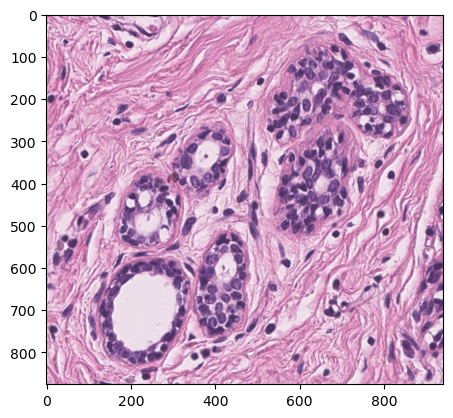

In [5]:
plt.imshow(tensor)

### Creating transforms

In [6]:
rotation_90_and_flip = Pipeline([
    Transpose(dim0=0,dim1=1),
    Flip(dims=(1,))
])

rotation_90 = Transpose(dim0=0,dim1=1)

rotation_270 = Pipeline([
    Transpose(dim0=0,dim1=1),
    Flip(dims=(0,))
])

flip_0 = Flip(dims=(0,))
flip_1 = Flip(dims=(1,))

left_shift = LeftShift(shift=300)
right_shift = RightShift(shift=300)
up_shift =  UpShift(shift=300)
down_shift = DownShift(shift=300)

### Visualizing transforms

In [7]:
def visualize_transformation(img : torch.Tensor, transformation : Callable) -> None:

    fig, (ax1, ax2) = plt.subplots(nrows=1,ncols=2)

    fig.set_size_inches(w=15,h=15)

    transformed = transformation(tensor)

    ax1.imshow(img)
    ax2.imshow(transformed)

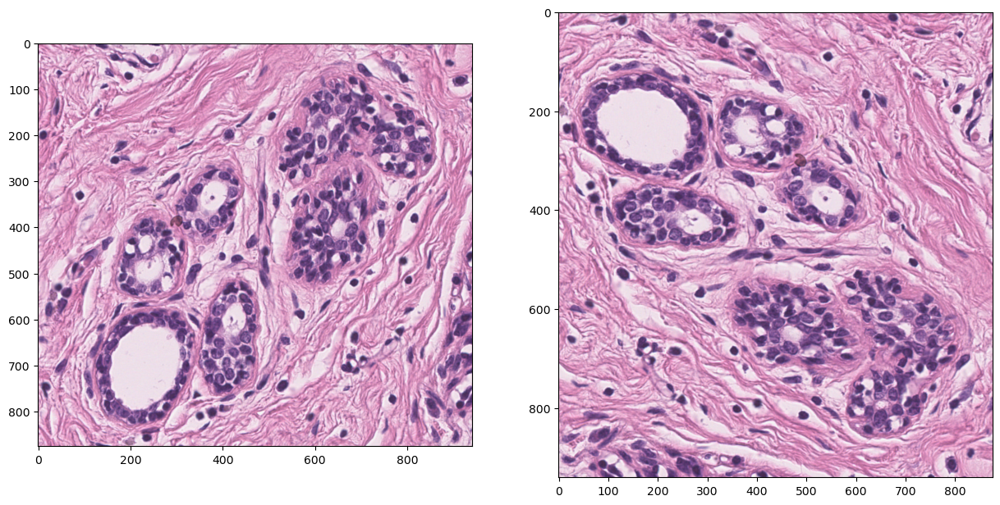

In [8]:
visualize_transformation(img, rotation_90_and_flip)

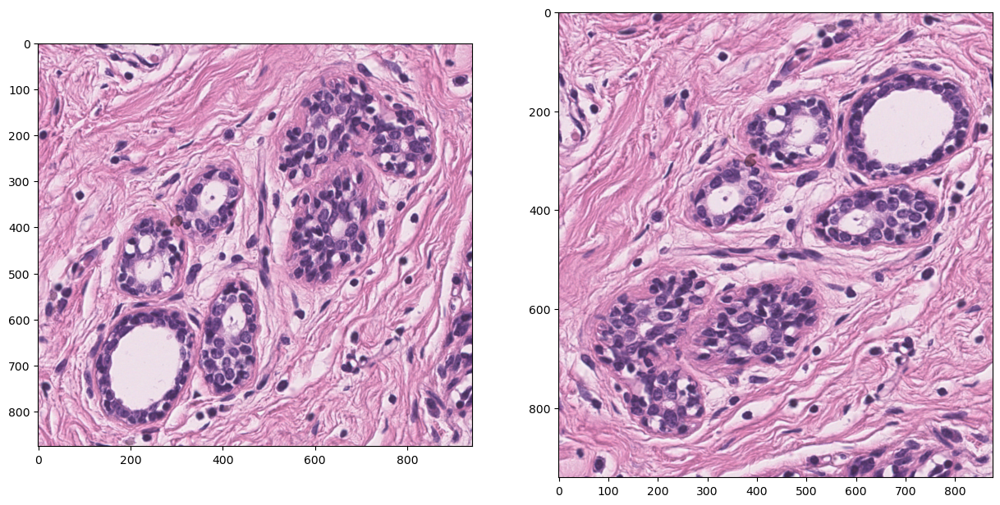

In [9]:
visualize_transformation(img, rotation_90)

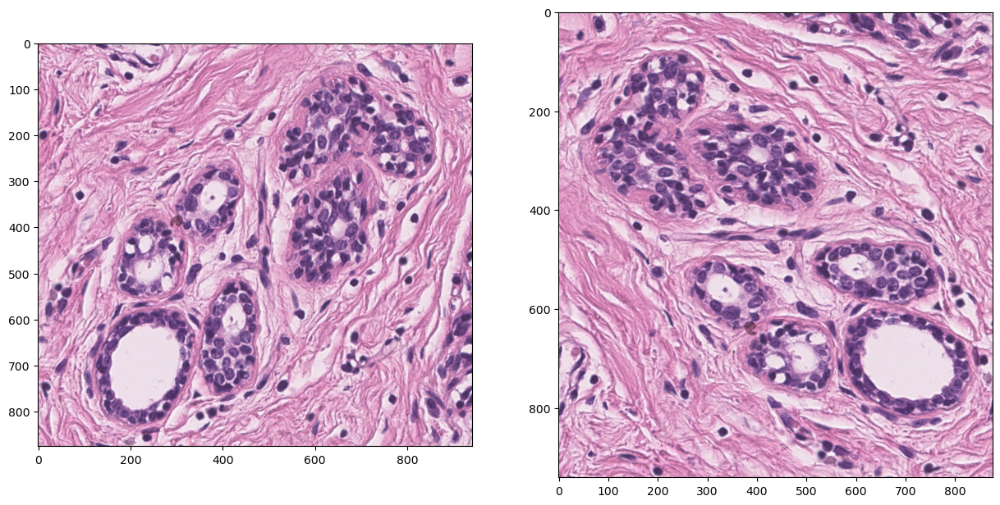

In [10]:
visualize_transformation(img, rotation_270)

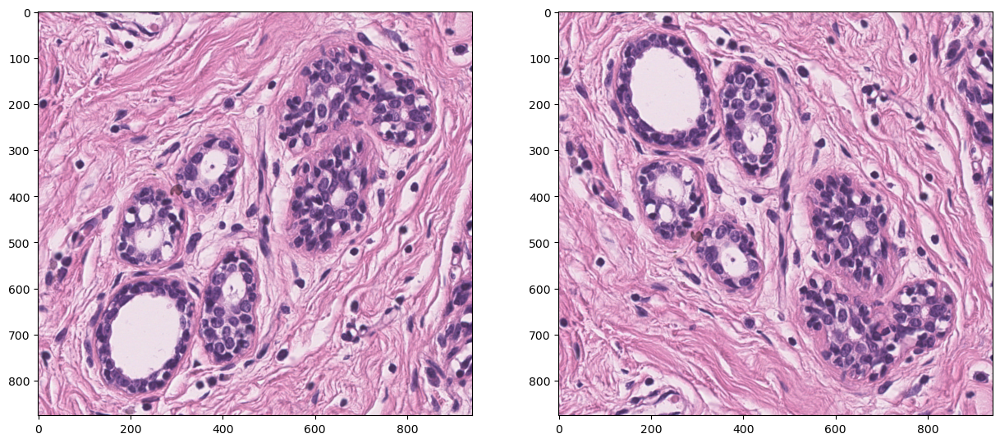

In [11]:
visualize_transformation(img, flip_0)

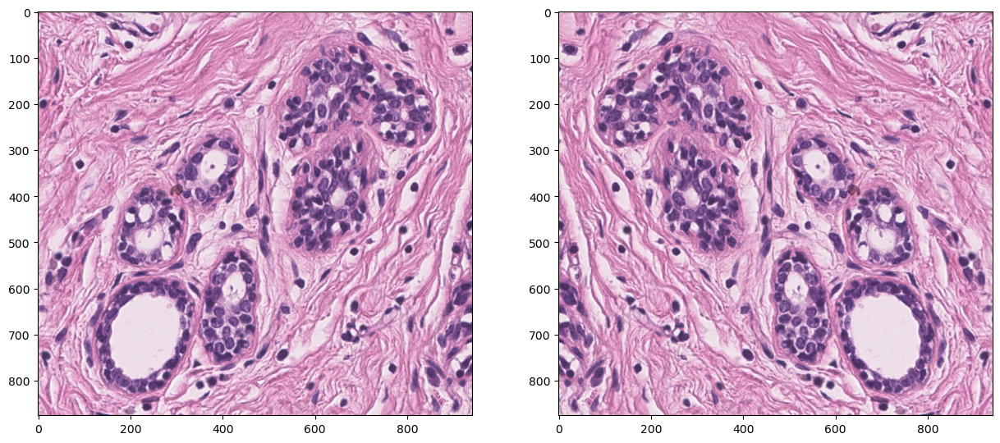

In [12]:
visualize_transformation(img, flip_1)

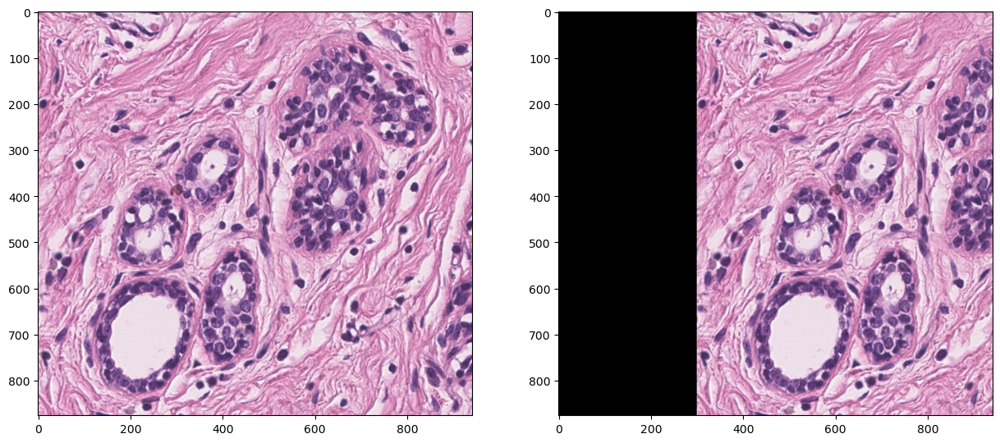

In [13]:
visualize_transformation(img, left_shift)

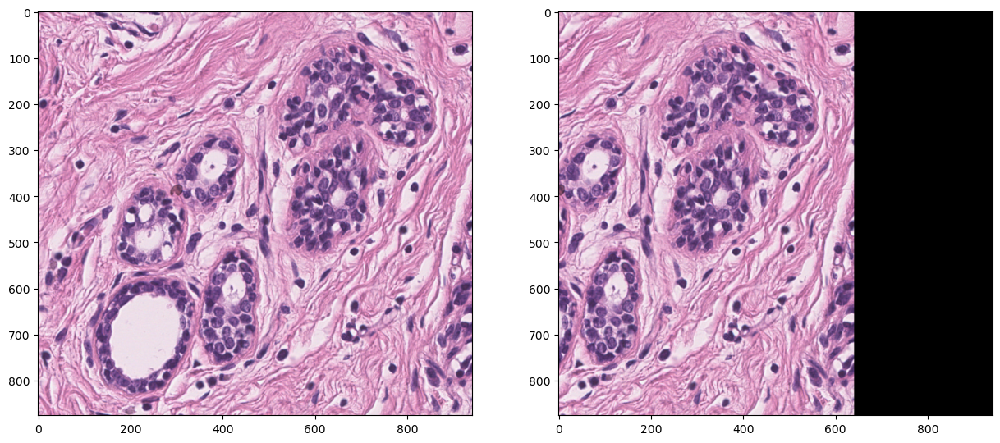

In [14]:
visualize_transformation(img, right_shift)

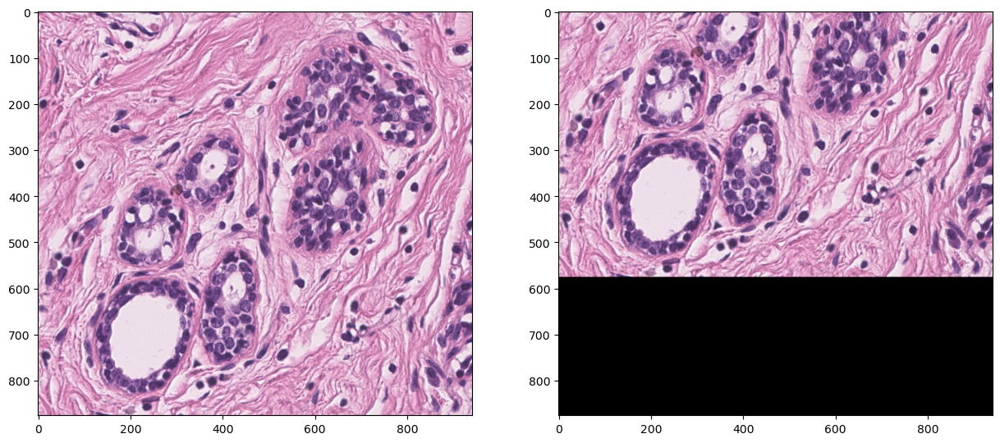

In [15]:
visualize_transformation(img, up_shift)

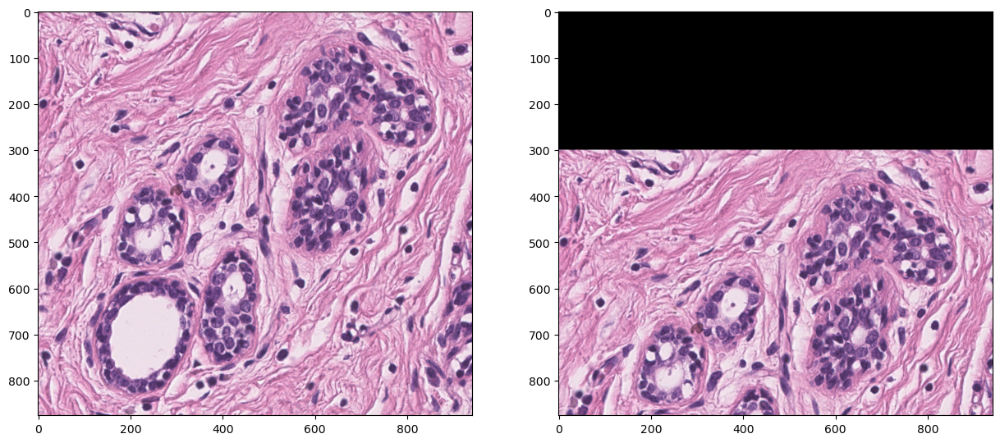

In [16]:
visualize_transformation(img, down_shift)